# Baseline testing with open models

## 1. face-recognition - https://github.com/ageitgey/face_recognition

In [57]:
!pip install face-recognition fastai -Uqq

In [58]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [59]:
import face_recognition
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from fastai.vision.all import *

In [60]:
path = Path('/content/drive/MyDrive/colab_notebooks/algovera/face_anon/test_data')

In [61]:
df = pd.read_csv(path/'test_data.csv').drop('Unnamed: 0', axis=1)

In [62]:
#return: A list of tuples of found face locations in css (top, right, bottom, left)
face_recognition.face_locations??

In [63]:
def get_xyhw(bbox):
    t, r, b, l = bbox
    xy = (l, b)
    height = b - t
    width = l - r
    return xy, height, width 

def get_rect(bbox):
    xy, h, w = get_xyhw(bbox)
    return patches.Rectangle(xy, h, w, linewidth=2, edgecolor='r', facecolor='none')

def get_all_rects(bboxes):
    rects = []
    for bbox in bboxes:
        rects.append(get_rect(bbox))
    return rects

def get_fr_dets(image_fn):
    

def plot_image_rects(image_fn):
    image = face_recognition.load_image_file(image_fn)
    face_locations = face_recognition.face_locations(image, model='cnn')
    rects = get_all_rects(face_locations)    

    fig, ax = plt.subplots(1,2, figsize=(12,12))
    ax[0].imshow(image)
    ax[1].imshow(image)
    for rect in rects:
        ax[1].add_patch(rect)

    ax[0].axis('off')
    ax[1].axis('off')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


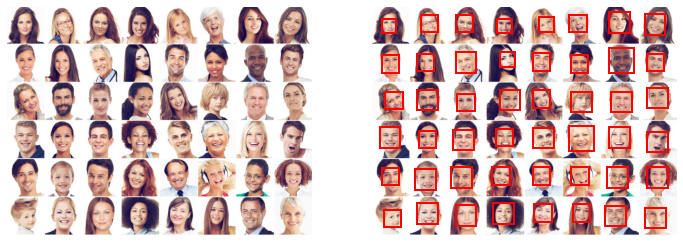

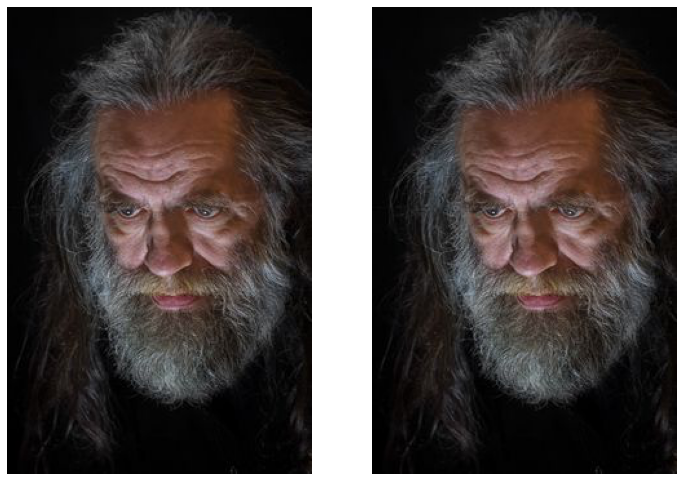

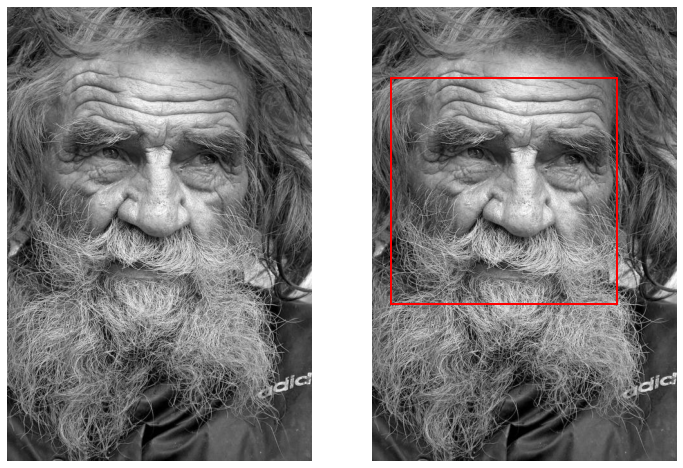

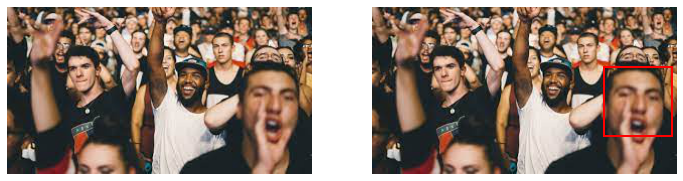

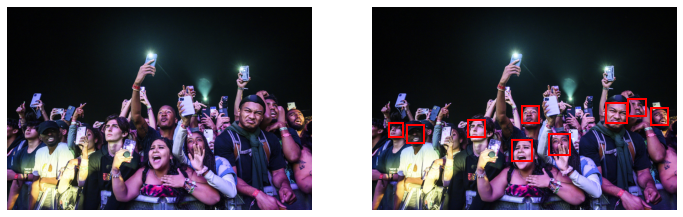

...

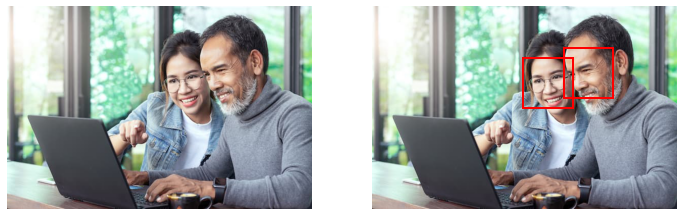

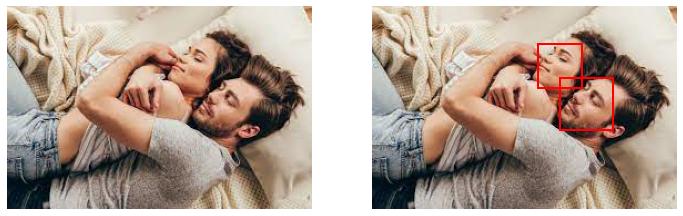

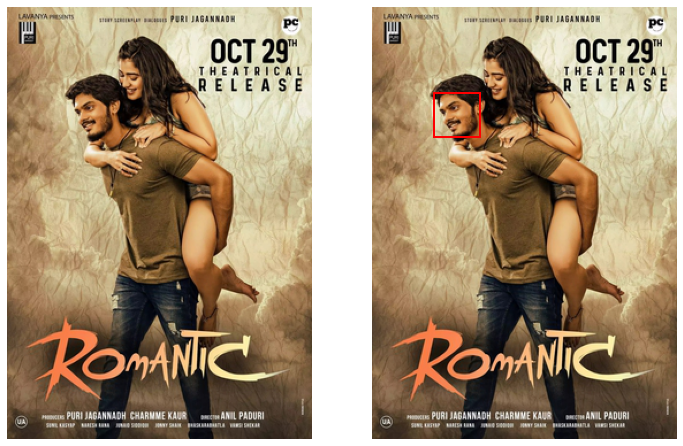

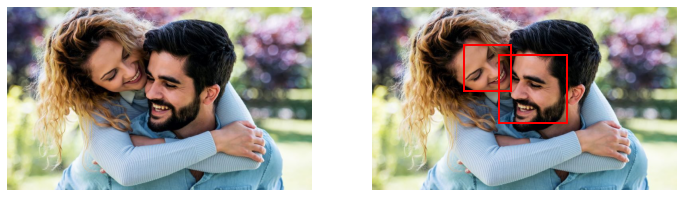

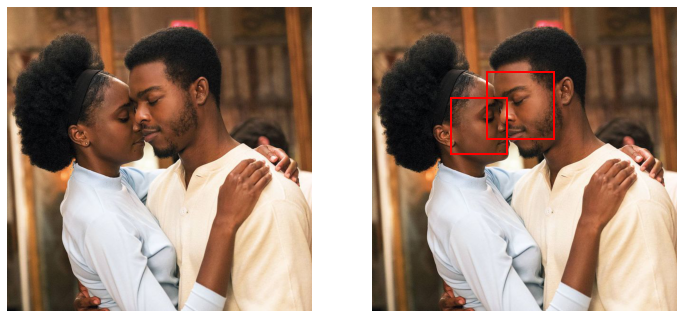

In [45]:
for fn in path.ls():
    if fn.suffix != '.csv':
        plot_image_rects(str(fn))

In [46]:
preds = []
for fn in path.ls():
    if fn.suffix != '.csv':
        image = face_recognition.load_image_file(str(fn))
        face_locations = face_recognition.face_locations(image, model='cnn')
        preds.append((fn.name, len(face_locations)))

In [47]:
df.merge(pd.DataFrame(preds, columns=['fn', 'face-recog Num Images']), on='fn')

,fn,Num Faces,face-recog Num Images
0,faces-1.jpg,48,48
1,faces-2.jpg,1,0
2,faces-3.jpg,1,1
3,faces-4.jpg,7,1
4,faces-5.jpg,9,9
5,faces-6.jpg,16,38
6,faces-7.jpg,11,7
7,faces-8.jpg,12,16
8,faces-9.jpg,7,7
9,faces-10.jpg,7,0


## kornia

In [64]:
!pip install kornia -Uqq

In [113]:
import cv2
import kornia as K
from kornia.contrib import FaceDetector, FaceDetectorResult, FaceKeypoint
import kornia.augmentation as Kaug


In [66]:
#kornia.contrib.FaceDetector to perform multi-face detection in real-time uding the YuNet model.

In [133]:
def draw_keypoint(img: np.ndarray, det: FaceDetectorResult, kpt_type: FaceKeypoint) -> np.ndarray:
    kpt = det.get_keypoint(kpt_type).int().tolist()
    return cv2.circle(img, kpt, 2, (255, 0, 0), 2)


def scale_image(img: np.ndarray, size: int) -> np.ndarray:
    h, w = img.shape[:2]
    scale = 1. * size / w
    return cv2.resize(img, (int(w * scale), int(h * scale)))


def apply_blur_face(img: torch.Tensor, img_vis: np.ndarray, det: FaceDetectorResult):
    # crop the face
    x1, y1 = det.xmin.int(), det.ymin.int()
    x2, y2 = det.xmax.int(), det.ymax.int()
    roi = img[..., y1:y2, x1:x2]

    # apply blurring and put back to the visualisation image
    roi = K.filters.gaussian_blur2d(roi, (21, 21), (35., 35.))
    roi = K.color.rgb_to_bgr(roi)
    img_vis[y1:y2, x1:x2] = K.tensor_to_image(roi)

def get_kornia_dets(fn: str, device: torch.device, dtype: torch.dtype):
    # load the image and scale (if needed)
    img_raw = cv2.imread(fn, cv2.IMREAD_COLOR)

    # preprocess
    img = K.image_to_tensor(img_raw, keepdim=False).to(device, dtype)
    img = K.color.bgr_to_rgb(img)

    img_vis = K.tensor_to_image(img.byte().clone())  # to later visualise

    # create the detector and find the faces !
    face_detection = FaceDetector().to(device, dtype)

    with torch.no_grad():
        dets = face_detection(img)

    # to decode later the detections
    dets = [FaceDetectorResult(o) for o in dets]

    for b in dets:
        if b.score < 0.6:  # skip detections with lower score
            continue
        
        # draw face bounding box around each detected face
        x1, y1 = b.top_left.int().tolist()
        x2, y2 = b.bottom_right.int().tolist()
        img_vis = cv2.rectangle(img_vis, (x1, y1), (x2, y2), (0, 255, 0), 4)

        # blur the detected faces
        apply_blur_face(img, img_vis, b)

    return K.tensor_to_image(img.byte().clone()), img_vis

def plot_kornia_images(fn: str, device: torch.device, dtype: torch.dtype):
    img, img_vis = get_kornia_dets(fn, device, dtype)
    fig, ax = plt.subplots(1,2, figsize=(12,12))
    ax[0].imshow(img)
    ax[1].imshow(img_vis)

    ax[0].axis('off')
    ax[1].axis('off')

/content/drive/MyDrive/colab_notebooks/algovera/face_anon/test_data/faces-4.jpg
/content/drive/MyDrive/colab_notebooks/algovera/face_anon/test_data/faces-5.jpg
/content/drive/MyDrive/colab_notebooks/algovera/face_anon/test_data/faces-22.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


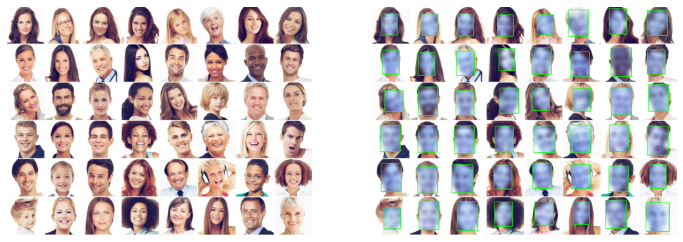

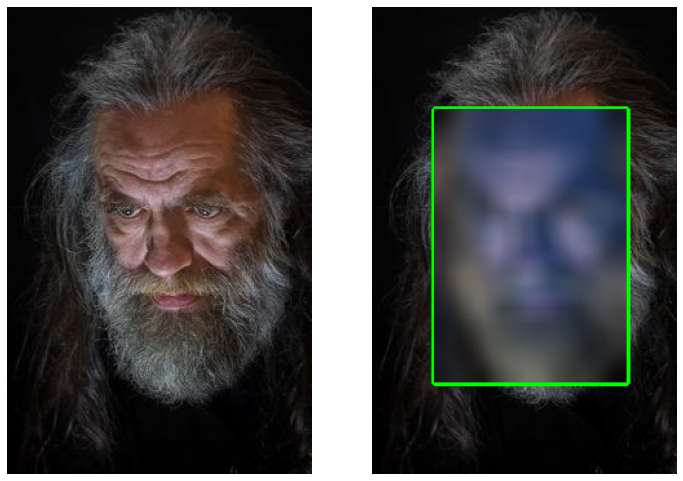

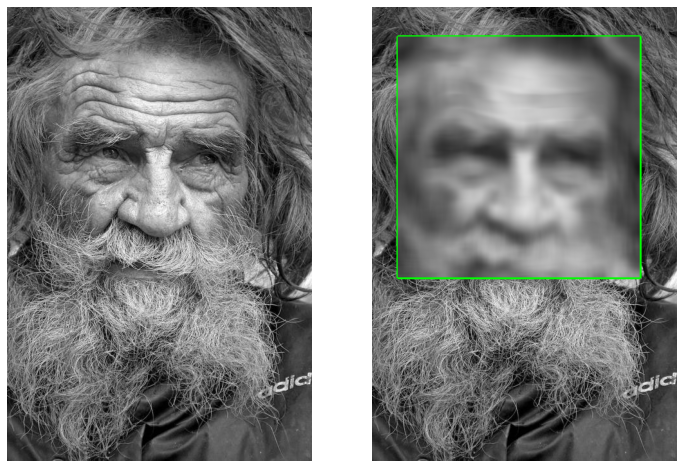

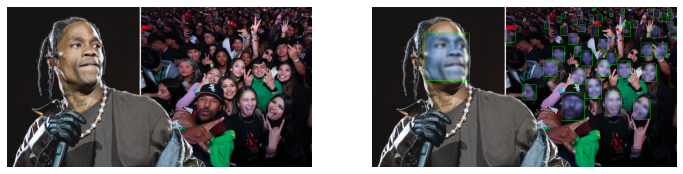

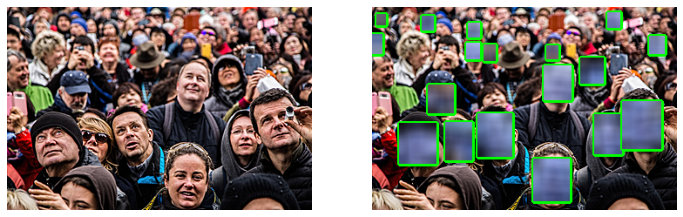

...

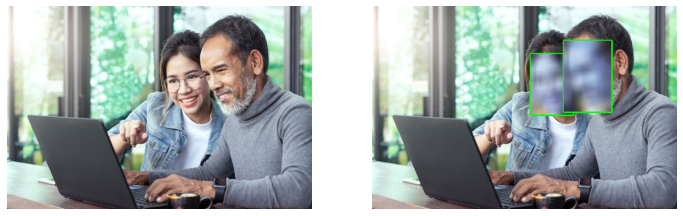

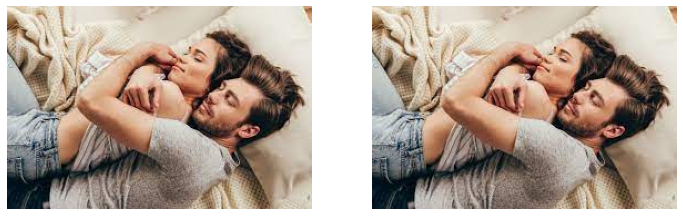

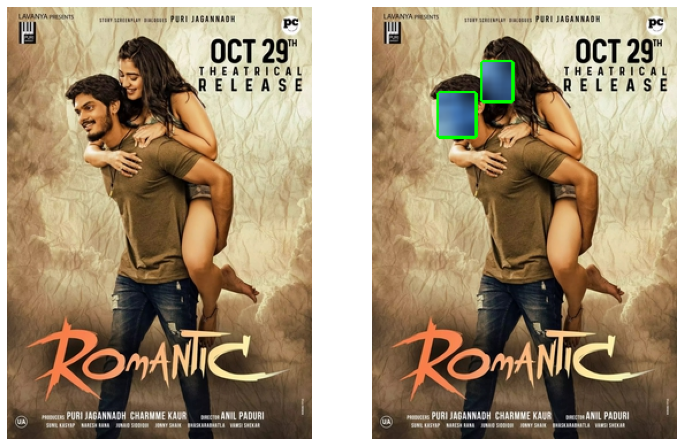

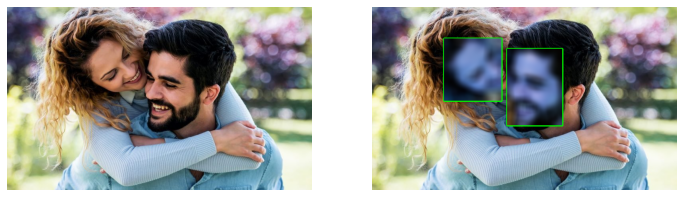

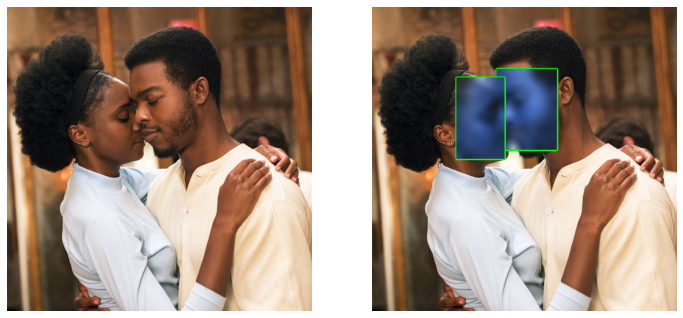

In [135]:
# select the device and type
device = torch.device('cuda')  # use 'cuda:0'
dtype = torch.float32

for fn in path.ls():
    if fn.suffix != '.csv':
        try:
          plot_kornia_images(str(fn), device, dtype)
        except:
          print(fn)  

In [141]:
f4 = cv2.imread(f'{path}/faces-4.jpg', cv2.IMREAD_COLOR); f4.shape

(166, 303, 3)

In [144]:
f5 = cv2.imread(f'{path}/faces-5.jpg', cv2.IMREAD_COLOR); f5.shape

(1665, 2500, 3)

In [145]:
f5 = cv2.imread(f'{path}/faces-22.jpg', cv2.IMREAD_COLOR); f5.shape

(1500, 2667, 3)

In [151]:
k4_rs = Kaug.Resize((256, 256))(K.image_to_tensor(f4).to(device, dtype))
k4_rs = K.color.bgr_to_rgb(k4_rs)

In [153]:
face_detection = FaceDetector().to(device, dtype)

with torch.no_grad():
    dets = face_detection(k4_rs)

# to decode later the detections
dets = [FaceDetectorResult(o) for o in dets]

In [ ]:
for b in dets:
    if b.score < 0.6:  # skip detections with lower score
        continue
    
    # draw face bounding box around each detected face
    x1, y1 = b.top_left.int().tolist()
    x2, y2 = b.bottom_right.int().tolist()
    img_vis = cv2.rectangle(img_vis, (x1, y1), (x2, y2), (0, 255, 0), 4)

    # blur the detected faces
    apply_blur_face(img, img_vis, b)